In [1]:
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import geopandas as gpd
from io import StringIO
# or: requests.get(url).content
from shapely.geometry import Point, LineString
import boto3
import pandas as pd

In [2]:
resp = urlopen("https://developer.trimet.org/gis/data/tm_boundary.zip")
myzip = ZipFile(BytesIO(resp.read()))
myzip.extractall('gis/export/')

In [3]:
resp = urlopen("https://developer.trimet.org/schedule/gtfs.zip")
myzip = ZipFile(BytesIO(resp.read()))
myzip.extractall('gtfs/')

In [4]:
gtfs_routes = pd.read_csv('gtfs/routes.txt')
gtfs_routes.head(3)

,route_id,agency_id,route_short_name,route_long_name,route_type,route_url,route_color,route_text_color,route_sort_order,network_id
0,1,TRIMET,1,Vermont,3,https://trimet.org/schedules/r001.htm,084C8D,FFFFFF,400,TRIMET
1,2,TRIMET,FX2,Division,3,https://trimet.org/schedules/r002.htm,61A744,FFFFFF,500,TRIMET
2,4,TRIMET,4,Fessenden,3,https://trimet.org/schedules/r004.htm,084C8D,FFFFFF,600,TRIMET


In [5]:
gtfs_routes[gtfs_routes['route_id']==14]

,route_id,agency_id,route_short_name,route_long_name,route_type,route_url,route_color,route_text_color,route_sort_order,network_id
9,14,TRIMET,14,Hawthorne/Foster,3,https://trimet.org/schedules/r014.htm,084C8D,FFFFFF,1700,TRIMET


In [6]:
# sort order puts MAX and streetcar at top even though the route numbers are higher
gtfs_routes.sort_values('route_sort_order')[['route_id','route_short_name','route_long_name']].to_json('gtfs/gtfs_routes.json',orient='records')

In [7]:
client = boto3.client("s3")
client.upload_file("gtfs/gtfs_routes.json", "meysohn-sandbox", "trimet_trip_planner/gtfs_routes.json",ExtraArgs={'ACL':'public-read'})

Make routes from `shapes.txt` file

In [8]:
gtfs_shapes = pd.read_csv('gtfs/shapes.txt')
gtfs_shapes.head(3)

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
0,575385,45.522879,-122.677388,1,0.0
1,575385,45.522913,-122.677396,2,12.6
2,575385,45.522988,-122.677431,3,41.3


In [9]:
gtfs_shapes['vertex_point'] = [Point(x, y) for x, y in zip(gtfs_shapes['shape_pt_lon'].to_numpy(),gtfs_shapes['shape_pt_lat'].to_numpy())]

/Users/benjaminmalnor/.pyenv/versions/miniconda3-latest/envs/geo-analysis/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:127: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Make shape vertices into shape lines

In [10]:
gtfs_shape_lines = gtfs_shapes.groupby('shape_id')[['vertex_point']].agg(lambda x: LineString(list(x))).reset_index().rename(columns={'vertex_point':'route_line'})

In [11]:
gtfs_shape_lines_gdf = gpd.GeoDataFrame(gtfs_shape_lines, crs="EPSG:4326", geometry='route_line')
gtfs_shape_lines_gdf.head(3)

,shape_id,route_line
0,575385,"LINESTRING (-122.67739 45.52288, -122.67740 45..."
1,575386,"LINESTRING (-122.69100 45.47603, -122.69157 45..."
2,575387,"LINESTRING (-122.72189 45.47623, -122.72236 45..."


In [12]:
gtfs_shape_lines_gdf.iloc[:10].explore()

In [13]:
gtfs_shape_lines_gdf.shape

(902, 2)

In [14]:
gtfs_trips = pd.read_csv('gtfs/trips.txt')
gtfs_trips.head(3)

,route_id,service_id,trip_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,trip_type,wheelchair_accessible,bikes_allowed
0,1,W.675,13878638,NaN,NaN,0,7680,575386,NaN,1,1
1,1,W.675,13878639,NaN,NaN,0,5779,575385,NaN,1,1
2,1,W.675,13878642,NaN,NaN,1,7683,575387,NaN,1,1


In [15]:
route_shapes = gtfs_trips.groupby(['route_id','shape_id']).agg(num_trips=('trip_id','nunique')).reset_index()
route_shapes.head(3)

,route_id,shape_id,num_trips
0,1,575385,1
1,1,575386,1
2,1,575387,2


## How to handle multiple shapes per route. 
I'm thinking take union of shapes?

In [16]:
shapes_lines_w_route = gtfs_shape_lines_gdf.merge(route_shapes[['route_id','shape_id']], how='inner', on='shape_id')
shapes_lines_w_route.head(3)

,shape_id,route_line,route_id
0,575385,"LINESTRING (-122.67739 45.52288, -122.67740 45...",1
1,575386,"LINESTRING (-122.69100 45.47603, -122.69157 45...",1
2,575387,"LINESTRING (-122.72189 45.47623, -122.72236 45...",1


In [17]:
from shapely.ops import unary_union

In [18]:
shapes_lines_w_route.groupby('route_id').agg(shape_count=('shape_id','nunique')).reset_index().sort_values('shape_count', ascending=True)

,route_id,shape_count
88,293,4
43,55,4
87,292,4
46,58,4
47,59,4
...,...,...
5,9,28
37,47,30
4,8,32
71,100,40


In [19]:
shapes_lines_w_route_reduced = shapes_lines_w_route.groupby('route_id')[['route_line']].agg(lambda x: unary_union(x)).reset_index()

/Users/benjaminmalnor/.pyenv/versions/miniconda3-latest/envs/geo-analysis/lib/python3.10/site-packages/pandas/core/ops/array_ops.py:75: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = libops.scalar_compare(x.ravel(), y, op)


In [20]:
shapes_lines_w_route_reduced.columns

Index(['route_id', 'route_line'], dtype='object')

In [21]:
shapes_lines_w_route_reduced.set_geometry('route_line', inplace=True)
shapes_lines_w_route_reduced.set_crs("EPSG:4326", inplace=True)

,route_id,route_line
0,1,"MULTILINESTRING ((-122.67739 45.52288, -122.67..."
1,2,"MULTILINESTRING ((-122.67586 45.52807, -122.67..."
2,4,"MULTILINESTRING ((-122.67957 45.51475, -122.67..."
3,6,"MULTILINESTRING ((-122.69305 45.51762, -122.69..."
4,8,"MULTILINESTRING ((-122.66200 45.58069, -122.66..."
...,...,...
84,288,"MULTILINESTRING ((-122.66673 45.53026, -122.66..."
85,290,"MULTILINESTRING ((-122.63505 45.43074, -122.63..."
86,291,"MULTILINESTRING ((-122.67508 45.52756, -122.67..."
87,292,"MULTILINESTRING ((-122.69120 45.51711, -122.69..."


convert to trimet crs so we can simplify with accurate units

In [22]:
trimet_crs = "EPSG:2913"
shapes_lines_w_route_proj = shapes_lines_w_route_reduced.to_crs(trimet_crs)

In [23]:
shapes_lines_w_route_proj['simplified_lines'] = shapes_lines_w_route_proj['route_line'].simplify(250)

In [24]:
simply_lines_with_routes = shapes_lines_w_route_proj.set_geometry("simplified_lines").to_crs("EPSG:4326")

In [25]:
simply_lines_with_routes.explore()

In [26]:
simply_lines_with_routes_name = simply_lines_with_routes[['route_id','simplified_lines']].merge(gtfs_routes[['route_id','route_long_name']], how='inner', on='route_id')

In [27]:
simply_lines_with_routes_name.head(3)

,route_id,simplified_lines,route_long_name
0,1,"MULTILINESTRING ((-122.67739 45.52288, -122.67...",Vermont
1,2,"MULTILINESTRING ((-122.67586 45.52807, -122.67...",Division
2,4,"MULTILINESTRING ((-122.67957 45.51475, -122.67...",Fessenden


In [28]:
simply_lines_with_routes_name.to_file("gis/export/simply_lines_with_routes_name.geojson", driver="GeoJSON")

In [29]:
simply_lines_with_routes_name[simply_lines_with_routes_name['route_id']==14]

,route_id,simplified_lines,route_long_name
9,14,"MULTILINESTRING ((-122.67854 45.51524, -122.67...",Hawthorne/Foster


In [30]:
for route_id in simply_lines_with_routes_name['route_id'].unique():
    one_route = simply_lines_with_routes_name[simply_lines_with_routes_name['route_id']==route_id].copy()
    one_route.to_file(f"gis/export/route_shapes/route_line_{route_id}.geojson", driver="GeoJSON")
    client = boto3.client("s3")
    client.upload_file(f"gis/export/route_shapes/route_line_{route_id}.geojson", "meysohn-sandbox", f"trimet_trip_planner/route_lines/route_line_{route_id}.geojson",ExtraArgs={'ACL':'public-read'})

## Buffer lines

In [31]:
tm_routes_proj = simply_lines_with_routes_name.to_crs("EPSG:2913")

In [32]:
# make distance same as trip planner config
# FYI - this took 36 mins last time
tm_routes_proj['buffer_geometry'] = tm_routes_proj['simplified_lines'].apply(lambda x: x.buffer(1600))

In [33]:
tm_routes_buffer = gpd.GeoDataFrame(tm_routes_proj.drop('simplified_lines', axis=1), crs="EPSG:2913", geometry="buffer_geometry")

In [34]:
tm_routes_buffer_view = tm_routes_buffer.to_crs("EPSG:4326")

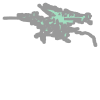

In [35]:
tm_routes_buffer_union = tm_routes_buffer_view.unary_union
tm_routes_buffer_union

In [36]:
tm_route_boundaries = pd.DataFrame([['trimet_route_buffer_boundary']],columns=['description'])
tm_route_boundaries_gpd = gpd.GeoDataFrame(tm_route_boundaries, crs="EPSG:4326", geometry=[tm_routes_buffer_union])

In [37]:
tm_route_boundaries_gpd.explore()

In [38]:
tm_route_boundaries_gpd.to_file("../tm_route_buffer_bounds.geojson", driver="GeoJSON")